# LOCKED POSITION RANDOMIZED DATA

FILENAME: budget_randomized.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 27-MAY-20

## PHASE 1: PROJECT SETUP

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [37]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po

import networkx as nx

In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_programs = 80
    num_of_rca = 120 # can change the amount of RCAs
    
    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    project_values = []
    subproject_values = []
    program_values = []
    rca_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['program_title'] = program_values
    raw_df['rca'] = rca_values
    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

# PHASE 2: FUNCTION TEST

In [4]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-12,subproject-12,program-19,rca-40,1354,853.90,714.96,551.15,480.75,433.76
9991,project-20,subproject-20,program-25,rca-77,1550,1312.87,1545.32,1367.80,997.05,903.22
9992,project-13,subproject-18,program-34,rca-54,17324,16007.59,18282.68,17331.51,18736.14,16934.37
9993,project-2,subproject-14,program-16,rca-81,8296,4245.55,4086.92,4832.88,5408.64,4589.30
9994,project-7,subproject-13,program-16,rca-45,5849,6940.29,6394.65,4828.84,3811.32,3150.60
9995,project-8,subproject-15,program-38,rca-88,23859,29322.03,25168.81,22836.32,20632.49,17318.47
9996,project-20,subproject-38,program-74,rca-63,15943,14306.54,15882.34,13776.79,10261.05,9508.92
9997,project-4,subproject-20,program-56,rca-95,4747,4053.36,3319.98,2257.77,2486.04,2458.57
9998,project-14,subproject-28,program-72,rca-106,6432,3695.80,3020.11,2595.09,2215.48,2130.41
9999,project-10,subproject-27,program-75,rca-103,4912,6113.86,5975.14,4646.79,3320.64,3134.85


In [5]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0         project-7-subproject-17-program-38-rca-12
1          project-3-subproject-26-program-9-rca-22
2        project-11-subproject-39-program-73-rca-85
3         project-20-subproject-6-program-25-rca-33
4        project-2-subproject-30-program-66-rca-119
                           ...                     
9995      project-8-subproject-15-program-38-rca-88
9996     project-20-subproject-38-program-74-rca-63
9997      project-4-subproject-20-program-56-rca-95
9998    project-14-subproject-28-program-72-rca-106
9999    project-10-subproject-27-program-75-rca-103
Name: key, Length: 10000, dtype: object

In [6]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                             key
4242    project-4-subproject-15-program-6-rca-62
5179    project-9-subproject-5-program-20-rca-42
5336  project-16-subproject-14-program-27-rca-30
5926   project-6-subproject-34-program-77-rca-18
6001   project-5-subproject-22-program-72-rca-76
6302  project-11-subproject-5-program-41-rca-102
7285  project-17-subproject-2-program-39-rca-107
8988  project-15-subproject-34-program-66-rca-36
9945  project-16-subproject-22-program-44-rca-80
Total count of duplicated rows :
9


In [7]:
# dropping ALL duplicte values 
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [8]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique values in data structures

In [9]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [10]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [11]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

In [12]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-19', 'project-8', 'project-9', 'project-5', 'project-17', 'project-1', 'project-11', 'project-2', 'project-14', 'project-15', 'project-6', 'project-18', 'project-20', 'project-4', 'project-10', 'project-7', 'project-3', 'project-12', 'project-16', 'project-13'}


In [13]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-37', 'subproject-32', 'subproject-40', 'subproject-33', 'subproject-21', 'subproject-28', 'subproject-22', 'subproject-16', 'subproject-5', 'subproject-38', 'subproject-2', 'subproject-17', 'subproject-36', 'subproject-8', 'subproject-7', 'subproject-14', 'subproject-1', 'subproject-24', 'subproject-13', 'subproject-31', 'subproject-34', 'subproject-12', 'subproject-20', 'subproject-29', 'subproject-35', 'subproject-19', 'subproject-23', 'subproject-15', 'subproject-6', 'subproject-9', 'subproject-25', 'subproject-26', 'subproject-30', 'subproject-18', 'subproject-4', 'subproject-11', 'subproject-27', 'subproject-39', 'subproject-10', 'subproject-3'}


In [14]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-72', 'program-74', 'program-21', 'program-28', 'program-57', 'program-30', 'program-9', 'program-60', 'program-3', 'program-65', 'program-45', 'program-25', 'program-52', 'program-32', 'program-48', 'program-27', 'program-54', 'program-41', 'program-46', 'program-64', 'program-38', 'program-40', 'program-43', 'program-6', 'program-35', 'program-59', 'program-2', 'program-1', 'program-5', 'program-17', 'program-16', 'program-23', 'program-80', 'program-33', 'program-18', 'program-55', 'program-39', 'program-47', 'program-44', 'program-75', 'program-61', 'program-71', 'program-73', 'program-79', 'program-24', 'program-36', 'program-68', 'program-76', 'program-29', 'program-13', 'program-7', 'program-42', 'program-63', 'program-66', 'program-20', 'program-62', 'program-10', 'program-49', 'program-19', 'program-8', 'program-14', 'program-56', 'program-12', 'program-53', 'program-77', 'program-15', 'program-50', 'program-78', 'program-22', 'program-37', 'program-51', 'program-34',

In [15]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-104', 'rca-53', 'rca-29', 'rca-66', 'rca-81', 'rca-46', 'rca-32', 'rca-5', 'rca-84', 'rca-64', 'rca-44', 'rca-47', 'rca-31', 'rca-67', 'rca-58', 'rca-27', 'rca-34', 'rca-78', 'rca-75', 'rca-19', 'rca-102', 'rca-33', 'rca-28', 'rca-106', 'rca-17', 'rca-39', 'rca-112', 'rca-16', 'rca-118', 'rca-83', 'rca-15', 'rca-97', 'rca-73', 'rca-21', 'rca-77', 'rca-100', 'rca-111', 'rca-72', 'rca-63', 'rca-60', 'rca-92', 'rca-96', 'rca-101', 'rca-49', 'rca-86', 'rca-61', 'rca-109', 'rca-12', 'rca-41', 'rca-9', 'rca-119', 'rca-45', 'rca-14', 'rca-70', 'rca-54', 'rca-38', 'rca-114', 'rca-71', 'rca-51', 'rca-22', 'rca-117', 'rca-110', 'rca-85', 'rca-48', 'rca-120', 'rca-94', 'rca-93', 'rca-1', 'rca-95', 'rca-105', 'rca-24', 'rca-103', 'rca-74', 'rca-113', 'rca-40', 'rca-8', 'rca-26', 'rca-56', 'rca-98', 'rca-89', 'rca-37', 'rca-116', 'rca-30', 'rca-91', 'rca-7', 'rca-18', 'rca-59', 'rca-25', 'rca-50', 'rca-82', 'rca-80', 'rca-43', 'rca-55', 'rca-10', 'rca-87', 'rca-108', 'rca-68', 'rca-76', 'rca-

### Visualize the generated data set

Project Title Visualization

In [16]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name, marginal="box", # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Ordinal  Records

In [26]:

col_df = train_df[['project', 'yr-2_oblig']]

sum_df = col_df.groupby('project').sum()

sum_df

,yr-2_oblig
project,
project-1,4909670.00
project-10,5849583.84
project-11,5307296.07
project-12,5400112.09
project-13,5668187.10
project-14,5851768.95
project-15,5043554.86
project-16,5770135.86
project-17,5313014.72


In [32]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

In [42]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-7,subproject-17
1,project-3,subproject-26
2,project-11,subproject-39
3,project-20,subproject-6
4,project-2,subproject-30
...,...,...
9995,project-8,subproject-15
9996,project-20,subproject-38
9997,project-4,subproject-20
9998,project-14,subproject-28


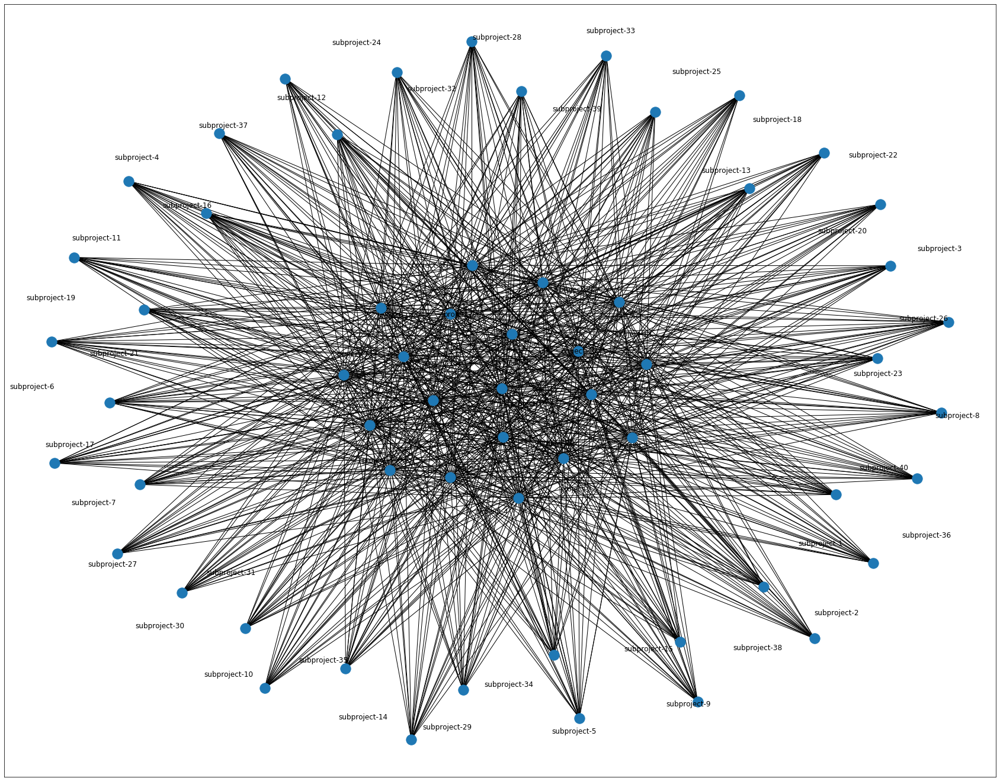

In [50]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (30,24))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

# END OF PROGRAM

"Si vacem para bellum"

# TEST SECTION

In [18]:
num_exe_proj = 15
num_exe_subproj = 30
num_exe_rca = 50
num_exe_program = 75

num_of_kc = 10
is_base = 1
is_nip = 1

In [19]:
exe_proj_list = ['proj-' + str(x) for x in range(num_exe_proj)]
exe_proj_list[:5]

['proj-0', 'proj-1', 'proj-2', 'proj-3', 'proj-4']

In [20]:
exe_subproj_list = ['subproj-' + str(x) for x in range(num_exe_subproj)]
exe_subproj_list[:5]

['subproj-0', 'subproj-1', 'subproj-2', 'subproj-3', 'subproj-4']

In [21]:
exe_rca_list = ['rca-' + str(x) for x in range(num_exe_rca)]
exe_rca_list[:5]

['rca-0', 'rca-1', 'rca-2', 'rca-3', 'rca-4']

In [22]:
exe_prog_list = ['program-' + str(x) for x in range(num_exe_program)]
exe_prog_list[:5]

['program-0', 'program-1', 'program-2', 'program-3', 'program-4']

# PHASE 4: EXPORT DATA

In [23]:
train_df.to_csv(r'locked_random_data_v1', index = False)